# Face Alignment using CNNs
---

In [1]:
# Imports
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import cv2
import os

In [2]:
# Make sure GPU is enabled
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


## Loading Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Load the training data 
train_data = np.load('/content/drive/MyDrive/ComputerVision/Report/training_images.npz', allow_pickle=True)
# Extract the images
images = train_data['images']
# and the data points
pts = train_data['points']
print(images.shape, pts.shape)

# Load the testing data
test_data = np.load('/content/drive/MyDrive/ComputerVision/Report/test_images.npz', allow_pickle=True)
test_images = test_data['images']
print(test_images.shape)

# Load examples
examples = np.load('/content/drive/MyDrive/ComputerVision/Report/examples.npz', allow_pickle=True)
ex_images = examples['images']
print(ex_images.shape)

# Check the data downloaded correctly
def confirm_checksum(filename, true_checksum):
  import subprocess
  checksum = subprocess.check_output(['shasum',filename]).decode('utf-8')
  assert checksum.split(' ')[0] == true_checksum, 'Checksum does not match for ' + filename + ' redownload the data.'

confirm_checksum('/content/drive/MyDrive/ComputerVision/Report/training_images.npz', 'f313a54fc57a1235e6307d176fc5fc83fd7ec530')
confirm_checksum('/content/drive/MyDrive/ComputerVision/Report/test_images.npz', '4b9efd8eb3b87c07d9c5400ef2494d476bc318a3')
confirm_checksum('/content/drive/MyDrive/ComputerVision/Report/examples.npz', 'bf51ebbf42f17e3cbe06bb299746565c53d16c40')

## Visualising Data

In [ ]:
def visualise_pts(img, pts):
  plt.imshow(img)
  plt.plot(pts[:, 0], pts[:, 1], 'r+')

# Visualize three random training images
for i in range(3):
  idx = np.random.randint(0, images.shape[0])
  visualise_pts(images[idx, ...], pts[idx, ...])
  plt.show()

In [ ]:
def euclid_dist(pred_pts, gt_pts):
    """
    Calculate the euclidean distance between pairs of points
    :param pred_pts: The predicted points
    :param gt_pts: The ground truth points
    :return: An array of shape (no_points,) containing the distance of each predicted point from the ground truth
    """
    pred_pts = np.reshape(pred_pts, (-1, 2))
    gt_pts = np.reshape(gt_pts, (-1, 2))
    return np.sqrt(np.sum(np.square(pred_pts - gt_pts), axis=-1))

## Data Augmentation

In [ ]:
import random
from sklearn.utils import shuffle

class DataAugmentation():
    def __init__(self, _flip=True, _rotate=True, _shift_brightness=True, _add_noise=True, _apply_vignette=True):
        self._flip = _flip
        self._rotate = _rotate
        self._shift_brightness = _shift_brightness
        self._add_noise = _add_noise
        self._apply_vignette = _apply_vignette
    
    def flip(self, img, pts):
        """
        Reflect image and landmarks horizontally
        """
        output_img = np.copy(img)
        output_img = np.fliplr(output_img)

        img_width = img.shape[1]
        # Each point reflection is img_width - point x coordinate
        output_pts = list(np.concatenate((np.asarray([img_width-p for p in pts[:,0]]).reshape(-1,1), pts[:,1].reshape(-1,1)), axis=-1))
        # Need to swap indexes for symmetrical landmarks
        idx_to_swap = [(0,6), (7,12), (8,11), 
                   (9,10), (19,20), (18,21), 
                   (15,17), (1,5), (2,4), 
                   (24,26), (23, 27), (22,28), 
                   (34,38), (35,37), (41,39), 
                   (33,29), (32,30)]
        for i,j in idx_to_swap:
            output_pts[i], output_pts[j] = output_pts[j], output_pts[i]

        return np.asarray(output_img), np.asarray(output_pts)

    def rotate(self, img, landmarks, angle):
        """
        Rotate image with landmarks
        """
        # Add a column of ones for further matrix multiplicaton
        landmarks = np.concatenate((landmarks, np.ones((42,1), dtype=np.float32)), axis=1)
        width, height = img.shape[:2]
        # Get rotation matrix
        rotation = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
        # Warp image
        output_img = cv2.warpAffine(img, rotation, (width, height))
        # Transform landmarks
        output_pts = np.asarray([np.dot(rotation, landmark.T) for landmark in landmarks])

        return output_img, output_pts

    def add_noise(self, _img, _pts):
        """
        Add salt and pepper noise to the image
        """
        output_img =_img.copy() 
        prob = 0.15 # noise probability 
        black = np.array([0, 0, 0], dtype='uint8')
        white = np.array([255, 255, 255], dtype='uint8')
        probs = np.random.random(output_img.shape[:2])
        output_img[probs < (prob/2)] = black
        output_img[probs > 1 - (prob / 2)] = white
        return output_img , _pts

    def change_brightness(self, _img, _pts, shift=-100):
        """
        Make image darker
        """
        output_img = np.copy(_img)
        output_img[:,:,:]= np.clip(np.float32(output_img[:,:,:])+shift,0,255)
        return output_img, _pts

    def apply_vignette(self, _img, _pts):
        """
        Add vignette to the image
        """
        (height, width) = _img.shape[:2]
        # Generate two gaussian kernels
        x_kernel = cv2.getGaussianKernel(height,70)
        y_kernel = cv2.getGaussianKernel(width,70)
        # Generate a matrix from two kernels
        result_kernel = x_kernel * y_kernel.T  
        # Create mask and normalize
        mask = 100 * result_kernel / np.linalg.norm(result_kernel)
        output_img = np.copy(_img)
        # Apply mask to each channel in the input image
        for i in range(3):
            output_img[:,:,i] = np.clip(output_img[:,:,i] * mask,0,255)
        return output_img, _pts

    def augment_data(self, _images, _pts):
        '''
        Augment image dataset
        '''
        imgs_aug = np.vstack([_images])
        pts_aug = np.vstack([_pts])
        # Reflect horizontally
        if self._flip:
            imgs_flip, pts_flip = zip(*[self.flip(img,p) for img,p in zip(_images, _pts)])

            imgs_aug = np.vstack([imgs_aug, imgs_flip])
            pts_aug = np.vstack([pts_aug, pts_flip])

        # Rotate
        if self._rotate:
            angles = [-35, -20, -10, 10, 20, 35]
            imgs_rotated, pts_rotated = zip(*[self.rotate(img,p, random.sample(angles, 1)[0]) for img,p in zip(_images, _pts)])

            imgs_aug = np.vstack([imgs_aug, imgs_rotated])
            pts_aug = np.vstack([pts_aug, pts_rotated])

        # Shift brightness
        if self._shift_brightness:
            imgs_dark, pts_dark = zip(*[self.change_brightness(img,p) for img,p in zip(_images, _pts)])

            imgs_aug = np.vstack([imgs_aug, imgs_dark])
            pts_aug = np.vstack([pts_aug, pts_dark])

        # Add noise
        if self._add_noise:
          imgs_noisy, pts_noisy = zip(*[self.add_noise(img,p) for img,p in zip(_images, _pts)])

          imgs_aug = np.vstack([imgs_aug, imgs_noisy])
          pts_aug = np.vstack([pts_aug, pts_noisy])

        # Apply vignettes
        if self._apply_vignette:
          imgs_vign, pts_vign = zip(*[self.apply_vignette(img,p) for img,p in zip(_images, _pts)])

          imgs_aug = np.vstack([imgs_aug, imgs_vign])
          pts_aug = np.vstack([pts_aug, pts_vign])
    
        return shuffle(imgs_aug, pts_aug)      

DataAugmentation = DataAugmentation()
images_aug, pts_aug = DataAugmentation.augment_data(images,pts)
visualise_pts(images_aug[0], pts_aug[0])
plt.show()
images_aug.shape

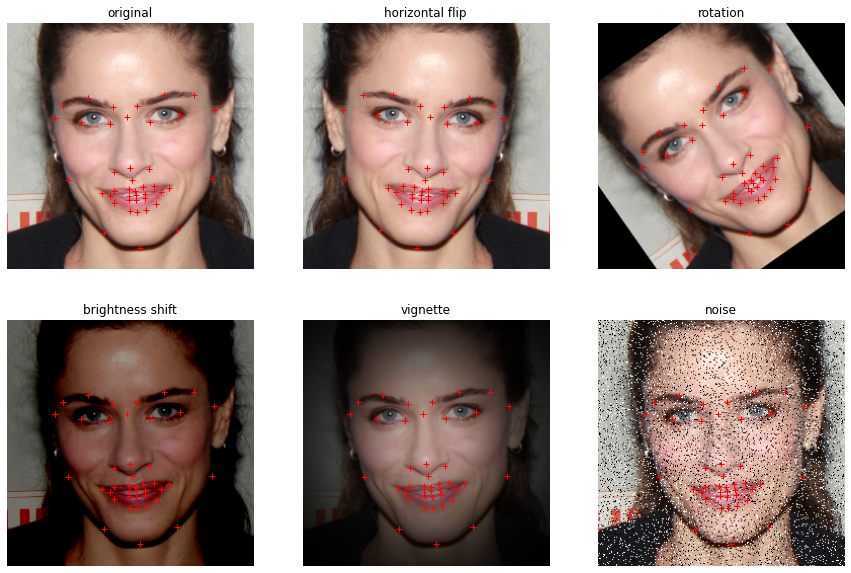

In [ ]:
# DATA AUGMENTATION EXAMPLE
# Original
plt.rcParams['figure.figsize'] = [15, 10]
plt.subplot(2,3,1)
plt.axis('off')
plt.title('original')
visualise_pts(images[0], pts[0])

# Flip
plt.subplot(2,3,2)
plt.axis('off')
plt.title('horizontal flip')
img_flip, pts_flip = DataAugmentation.flip(images[0], pts[0])
visualise_pts(img_flip, pts_flip)

# Rotation
plt.subplot(2,3,3)
plt.axis('off')
plt.title('rotation')
img_rotated, pts_rotated = DataAugmentation.rotate(images[0], pts[0], 35)
visualise_pts(img_rotated, pts_rotated)

# Brightness shift
plt.subplot(2,3,4)
plt.axis('off')
plt.title('brightness shift')
img_br, pts_br = DataAugmentation.change_brightness(images[0], pts[0])
visualise_pts(img_br, pts_br)

# Vignette
plt.subplot(2,3,5)
plt.axis('off')
plt.title('vignette')
img_vign, pts_vign = DataAugmentation.apply_vignette(images[0], pts[0])
visualise_pts(img_vign, pts_vign)

# Noise
plt.subplot(2,3,6)
plt.axis('off')
plt.title('noise')
img_noisy, pts_noisy = DataAugmentation.add_noise(images[0], pts[0])
visualise_pts(img_noisy, pts_noisy)
plt.savefig("data_augmentation.png")
plt.show()

## Pre-Processing

In [ ]:
def preprocess_img(_img):
    '''
    preprocess image for the CNN
    :param _img: a single RGB image
    :return: a new image with scaled pixel values and lower resolution
    '''
    # Scale pixel values to 0-1 range
    _img = _img.astype(np.float32)/255
    # Lower resolution
    _img = cv2.resize(_img, dsize=(96, 96), interpolation=cv2.INTER_CUBIC)
    return _img

def preprocess_pts(_pts):
    '''
    preprocess landmarks according to the new image resolution
    :param _pts: facial landmarks for a given image
    :return: scaled landmarks
    '''
    _pts = _pts/(244/96)
    return _pts

# Use 80% of the data for training
split_pt = np.uint(images_aug.shape[0]*0.8) 

X_train = np.asarray(list(map(preprocess_img, images_aug[:split_pt])))
y_train = np.asarray(list(map(preprocess_pts, pts_aug[:split_pt]))).reshape(-1,84)

# And the rest for validation
X_val = np.asarray(list(map(preprocess_img, images_aug[split_pt:])))
y_val = np.asarray(list(map(preprocess_pts, pts_aug[split_pt:]))).reshape(-1,84)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(13492, 96, 96, 3) (13492, 84)
(3374, 96, 96, 3) (3374, 84)


In [ ]:
def transform_to_shape(_pts):
    '''
    Transform a vector of xy coordinates into face shape
    :patam _pts: numpy array of consecutive xy coordinates
    :return: xy points arranged as a face shape
    '''
    _pts = _pts.reshape(-1,1)
    x_pts = _pts[::2]
    y_pts = np.flip(_pts[::-2])
    return np.concatenate((x_pts,y_pts), axis=1)

def reshape_to_norm(_pts, factor=(244/96)):
    '''
    Reshape predicted points for given images to the original 244x244 image size
    :param _pts: an array of image points for N images
    :param factor: scaling factor
    :return: an array of reshaped points for each image
    '''
    _pts = np.asarray([transform_to_shape(p*factor) for p in _pts])
    return _pts

## Building the Model

In [ ]:
from keras.layers import Input, Dense, Conv2D, BatchNormalization, MaxPool2D, Flatten, Dropout, Normalization
from keras import Model
from keras.applications.inception_v3 import InceptionV3

class ModelBuilder():

    def __init__(self, input_shape=(96,96,3)):
        self.input_shape = input_shape

    def build_conv_model(self):
        '''
        Build CNN model
        '''
      
        inputs = keras.Input(shape=self.input_shape, name='image')

        # Normalize inputs into a distribution centered around 0 mean with standard deviation of 1
        preprocess = Normalization()
        x = preprocess(inputs)
        # Layer 1
        x = Conv2D(32, 3, padding='same', activation='relu')(x)
        x = BatchNormalization(momentum=0.6)(x)
        x = MaxPool2D((2, 2))(x)
        # Layer 2
        x = Conv2D(64, 3, padding='same', activation='relu')(x)
        x = BatchNormalization(momentum=0.6)(x)
        x = MaxPool2D((2, 2))(x)
        # Layer 3
        x = Conv2D(64, 3, padding='same', activation='relu')(x)
        x = BatchNormalization(momentum=0.6)(x)
        x = MaxPool2D((2, 2))(x)
        # Layer 4
        x = Conv2D(64, 3, padding='same', activation='relu')(x)
        x = BatchNormalization(momentum=0.6)(x)
        x = MaxPool2D((2, 2))(x)
        # Layer 5
        x = Conv2D(128, 3, padding='same', activation='relu')(x)
        x = BatchNormalization(momentum=0.6)(x)
        # Layer 6
        x = Conv2D(128, 3, padding='same', activation='relu')(x)
        x = BatchNormalization(momentum=0.6)(x)
        x = Dropout(.2)(x)
        # Layer 7
        x = Flatten()(x)
        x = Dense(1024, activation='relu')(x)
        x = Dropout(.2)(x)
        # Layer 8
        outputs = Dense(84)(x)

        # Return the model
        return Model(inputs=inputs, outputs=outputs)
    
    def build_transfer_learning_model(self):
        '''
        Build transfer learning model based on InceptionV3 with trainable weights
        '''
        # Create base model
        base_model = InceptionV3(input_shape=self.input_shape, weights='imagenet', include_top=False)
        last_layer = base_model.get_layer('mixed2')
        last_output = last_layer.output
 
        x = Flatten()(last_output)
        x = Dense(1024, activation='relu')(x)
        outputs = Dense(84)(x)

        # Return the model
        return Model(inputs=base_model.input, outputs=outputs)

    def build_transfer_learning_model_nt(self):
        '''
        Build transfer learning model based on InceptionV3 with non-trainable weights
        '''
        # Create base model
        base_model = InceptionV3(input_shape=self.input_shape, weights='imagenet', include_top=False)
        # Freeze layers
        for layer in base_model.layers:
              layer.trainable = False

        last_layer = base_model.get_layer('mixed2')
        last_output = last_layer.output
 
        x = Flatten()(last_output)
        x = Dense(1024, activation='relu')(x)
        outputs = Dense(84)(x)

        # Return the model
        return Model(inputs=base_model.input, outputs=outputs)

model_builder = ModelBuilder()         

## Training 

In [ ]:
from keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
import datetime

# Load the TensorBoard notebook extension to visualize the experiments
%load_ext tensorboard

In [ ]:
def create_callbacks():
    '''
    Clear logs and initialize callbacks
    '''
    # Clear any logs from previous runs
    !rm -rf ./logs/

    # Initialize log directory
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

    # Initialize callbacks for the model
    best_weights_path = '/content/drive/MyDrive/ComputerVision/Report/Weights/Best' # path to store weights
    tensorboard = TensorBoard(log_dir=log_dir, histogram_freq=1) # tensorboard to plot results
    early_stopping  = EarlyStopping(monitor='val_accuracy', patience=10) # stop if the validation accuracy is not increasing after 10 epochs
    model_checkpoint = ModelCheckpoint(best_weights_path, monitor='val_accuracy', verbose=1, save_weights_only=True, save_best_only=True)
    return tensorboard, early_stopping, model_checkpoint

In [ ]:
BATCH_SIZE = 64
EPOCHS = 100

### CNN

In [ ]:
conv_model = model_builder.build_conv_model()
conv_model.compile(optimizer='adam', 
                   loss='mean_squared_error',
                   metrics=['accuracy'])

conv_model.summary()

In [ ]:
callbacks = create_callbacks()

# Train the model
conv_history = conv_model.fit(X_train, y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_data=(X_val, y_val), callbacks=[callbacks])

Epoch 1/100
211/211 [==============================] - ETA: 0s - loss: 104.4322 - accuracy: 0.5293
Epoch 1: val_accuracy improved from -inf to 0.76586, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 11s 36ms/step - loss: 104.4322 - accuracy: 0.5293 - val_loss: 14.4027 - val_accuracy: 0.7659
Epoch 2/100
210/211 [============================>.] - ETA: 0s - loss: 23.6830 - accuracy: 0.6307
Epoch 2: val_accuracy improved from 0.76586 to 0.79520, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 7s 31ms/step - loss: 23.6662 - accuracy: 0.6310 - val_loss: 9.6231 - val_accuracy: 0.7952
Epoch 3/100
210/211 [============================>.] - ETA: 0s - loss: 19.4033 - accuracy: 0.6822
Epoch 3: val_accuracy improved from 0.79520 to 0.82158, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 7s 32m

In [ ]:
# Show the results using TensorBoard
%tensorboard --logdir logs/fit

### Inception Model

#### Trainable Weights

In [ ]:
inc_model = model_builder.build_transfer_learning_model()
inc_model.compile(optimizer='adam', 
                  loss='mean_squared_error',
                  metrics=['accuracy'])

inc_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 96, 96, 3)]  0           []                               
                                                                                                  
 conv2d_12 (Conv2D)             (None, 47, 47, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization_12 (BatchN  (None, 47, 47, 32)  96          ['conv2d_12[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation (Activation)        (None, 47, 47, 32)   0           ['batch_normalization_12[0]

In [ ]:
callbacks = create_callbacks()

# Train the model
inc_history = inc_model.fit(X_train, y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_data=(X_val, y_val), callbacks=[callbacks])

Epoch 1/100
211/211 [==============================] - ETA: 0s - loss: 43.4043 - accuracy: 0.7587
Epoch 1: val_accuracy improved from -inf to 0.86426, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 18s 72ms/step - loss: 43.4043 - accuracy: 0.7587 - val_loss: 28.9496 - val_accuracy: 0.8643
Epoch 2/100
210/211 [============================>.] - ETA: 0s - loss: 2.6324 - accuracy: 0.8802
Epoch 2: val_accuracy improved from 0.86426 to 0.88174, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 14s 66ms/step - loss: 2.6321 - accuracy: 0.8802 - val_loss: 3.9835 - val_accuracy: 0.8817
Epoch 3/100
211/211 [==============================] - ETA: 0s - loss: 1.9552 - accuracy: 0.8959
Epoch 3: val_accuracy improved from 0.88174 to 0.89034, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 13s 61ms/s

In [ ]:
# Show the results using TensorBoard
%tensorboard --logdir logs/fit

#### Non-trainable Weights

In [ ]:
inc_model_nt = model_builder.build_transfer_learning_model_nt()

inc_model_nt.compile(optimizer='adam', 
                          loss='mean_squared_error',
                          metrics=['accuracy'])

inc_model_nt.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 96, 96, 3)]  0           []                               
                                                                                                  
 conv2d_106 (Conv2D)            (None, 47, 47, 32)   864         ['input_2[0][0]']                
                                                                                                  
 batch_normalization_106 (Batch  (None, 47, 47, 32)  96          ['conv2d_106[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_94 (Activation)     (None, 47, 47, 32)   0           ['batch_normalization_106[0

In [ ]:
callbacks = create_callbacks()

# Train the model
inc_nt_history = inc_model_nt.fit(X_train, y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_data=(X_val, y_val), callbacks=[callbacks])

Epoch 1/100
211/211 [==============================] - ETA: 0s - loss: 41.9367 - accuracy: 0.7477
Epoch 1: val_accuracy improved from -inf to 0.86129, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 10s 42ms/step - loss: 41.9367 - accuracy: 0.7477 - val_loss: 4.5507 - val_accuracy: 0.8613
Epoch 2/100
210/211 [============================>.] - ETA: 0s - loss: 3.6944 - accuracy: 0.8725
Epoch 2: val_accuracy improved from 0.86129 to 0.86811, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 8s 37ms/step - loss: 3.6908 - accuracy: 0.8724 - val_loss: 3.5042 - val_accuracy: 0.8681
Epoch 3/100
211/211 [==============================] - ETA: 0s - loss: 2.8486 - accuracy: 0.8818
Epoch 3: val_accuracy improved from 0.86811 to 0.87315, saving model to /content/drive/MyDrive/ComputerVision/Report/Weights/Best
211/211 [==============================] - 9s 42ms/step

In [ ]:
# Show the results using TensorBoard
%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.

## Model Selection

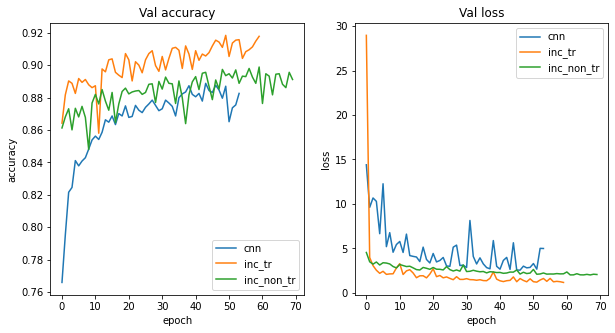

In [ ]:
# Plot validation accuracy and loss for both models
plt.rcParams['figure.figsize'] = [10, 5]

plt.subplot(1,2,1)
plt.title('Val accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.plot(conv_history.history['val_accuracy'])
plt.plot(inc_history.history['val_accuracy'])
plt.plot(inc_nt_history.history['val_accuracy'])
plt.legend(['cnn', 'inc_tr','inc_non_tr'], loc='lower right')

plt.subplot(1,2,2)
plt.title('Val loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.plot(conv_history.history['val_loss'])
plt.plot(inc_history.history['val_loss'])
plt.plot(inc_nt_history.history['val_loss'])
plt.legend(['cnn','inc_tr','inc_non_tr'], loc='upper right')
plt.savefig("conv_vs_pretrained.png")
plt.show()

In [ ]:
# Evaluate models
conv_hist = conv_history.history
print('Conv model: terminated after {} epochs, highest train acc: {:.2f}, highest val acc: {:.2f}, lowest train loss: {:.2f}, lowest val loss: {:.2f}'.format(len(conv_hist['val_accuracy']), 
                                                                                                                                                              max(conv_hist['accuracy']),
                                                                                                                                                              max(conv_hist['val_accuracy']), 
                                                                                                                                                              min(conv_hist['loss']),
                                                                                                                                                              min(conv_hist['val_loss'])))

inc_hist = inc_history.history
print('Inception model, trainable weights: terminated after {} epochs, highest train acc: {:.2f}, highest val acc: {:.2f}, lowest train loss: {:.2f}, lowest val loss: {:.2f}'.format(len(inc_hist['val_accuracy']), 
                                                                                                                                                                                      max(inc_hist['accuracy']),
                                                                                                                                                                                      max(inc_hist['val_accuracy']), 
                                                                                                                                                                                      min(inc_hist['loss']),
                                                                                                                                                                                      min(inc_hist['val_loss'])))

inc_non_tr_hist = inc_nt_history.history
print('Inception model, non-trainable weights: terminated after {} epochs, highest train acc: {:.2f}, highest val acc: {:.2f}, lowest train loss: {:.2f}, lowest val loss: {:.2f}'.format(len(inc_non_tr_hist['val_accuracy']), 
                                                                                                                                                                                          max(inc_non_tr_hist['accuracy']),
                                                                                                                                                                                          max(inc_non_tr_hist['val_accuracy']), 
                                                                                                                                                                                          min(inc_non_tr_hist['loss']),
                                                                                                                                                                                          min(inc_non_tr_hist['val_loss'])))                                                                                                                                                             
                                                                                                                                            


Conv model: terminated after 54 epochs, highest train acc: 0.88, highest val acc: 0.89, lowest train loss: 5.31, lowest val loss: 2.56
Inception model, trainable weights: terminated after 60 epochs, highest train acc: 0.96, highest val acc: 0.92, lowest train loss: 0.28, lowest val loss: 1.18
Inception model, non-trainable weights: terminated after 70 epochs, highest train acc: 0.96, highest val acc: 0.90, lowest train loss: 0.29, lowest val loss: 2.03


In [ ]:
# COMPARE PREDICTIONS
plt.rcParams['figure.figsize'] = [30, 15]

# Predict landmarks with all models
X_examples = np.asarray([cv2.resize(img, dsize=(96, 96), interpolation=cv2.INTER_CUBIC) for img in ex_images])
X_examples = X_examples.astype(np.float32)/255
conv_pred = reshape_to_norm(conv_model.predict(X_examples))
inc_pred = reshape_to_norm(inc_model.predict(X_examples))
inc_nt_pred = reshape_to_norm(inc_model_nt.predict(X_examples))

for i in range(6):
    plt.subplot(3,6,i+1)
    plt.axis('off')
    visualise_pts(ex_images[i], conv_pred[i])

for i in range(6):
    plt.subplot(3,6,i+7)
    plt.axis('off')
    visualise_pts(ex_images[i], inc_pred[i])

for i in range(6):
    plt.subplot(3,6,i+13)
    plt.axis('off')
    visualise_pts(ex_images[i], inc_nt_pred[i])

plt.savefig("conv_pretrained_samples.png")
plt.show()

Output hidden; open in https://colab.research.google.com to view.

## Measuring Error

In [ ]:
# Calculate errors
def get_model_error(model, data, gt):
  '''
  Calculate average euclidean distance between prediction and ground truth for each image
  :param model: trained model
  :param data: image dataset
  :param gt: ground truth landmarks for each image in data
  :return: average error for each image
  '''

  pred = model.predict(data)
  err = []
  for i in range(data.shape[0]):
      avg_dist = np.average(euclid_dist(pred[i], gt[i]))
      err.append(avg_dist)
  
  return np.asarray(err)

conv_err = get_model_error(conv_model, X_val, y_val)
inc_err = get_model_error(inc_model, X_val, y_val)
inc_nt_err = get_model_error(inc_model_nt, X_val, y_val)


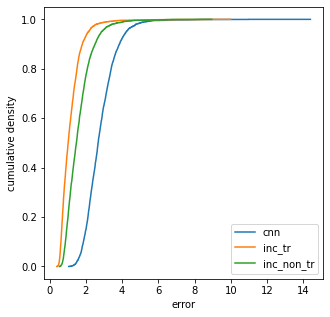

In [ ]:
# Visualise cumulative density
plt.rcParams['figure.figsize'] = [5, 5]
plt.xlabel('error')
plt.ylabel('cumulative density')
for data_item in [conv_err, inc_err, inc_nt_err]:
    plt.step(np.sort(data_item), np.linspace(0,1,len(data_item)))
    plt.legend(['cnn','inc_tr','inc_non_tr'], loc='lower right')
    plt.savefig("cum_dist.png")

## Testing Data Prediction

In [ ]:
# Create a model
model = model_builder.build_transfer_learning_model()
model.load_weights('/content/drive/MyDrive/ComputerVision/Report/Weights/best_weights/Best') # insert path for the weights

In [ ]:
# Predict landmarks for the testing data
test_data = np.asarray(list(map(preprocess_img, test_images)))
test_pred = reshape_to_norm(model.predict(test_data))
test_data.shape, test_pred.shape

((554, 96, 96, 3), (554, 42, 2))

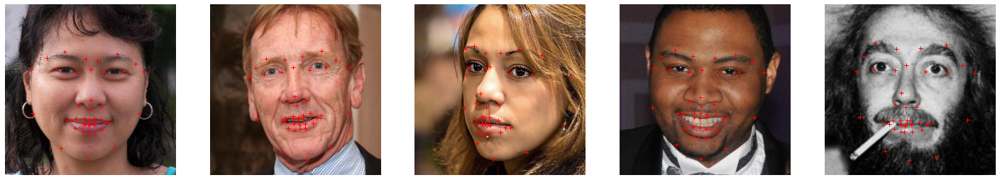

In [ ]:
# Show successful predictions
plt.rcParams['figure.figsize'] = [25, 5]
successful_cases = [545, 96, 22, 110, 451]
for i,idx in enumerate(successful_cases):
    plt.subplot(1,5,i+1)
    plt.axis('off')
    img_test = test_images[idx]
    pts_test = test_pred[idx]
    visualise_pts(img_test, pts_test)

plt.savefig("pred_success.png")
plt.show()

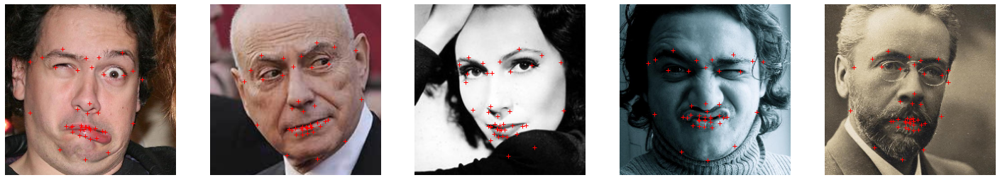

In [ ]:
# Show failure cases
faulty_cases = [107, 228, 378, 513, 20]
for i,idx in enumerate(faulty_cases):
    plt.subplot(1,5,i+1)
    plt.axis('off')
    img_test = test_images[idx]
    pts_test = test_pred[idx]
    visualise_pts(img_test, pts_test)

plt.savefig("pred_fail.png")
plt.show()

In [ ]:
def save_as_csv(points, location = '.'):
    """
    Save the points out as a .csv file
    :param points: numpy array of shape (no_test_images, no_points, 2) to be saved
    :param location: Directory to save results.csv in. Default to current working directory
    """
    assert points.shape[0]==554, 'wrong number of image points, should be 554 test images'
    assert np.prod(points.shape[1:])==2*42, 'wrong number of points provided. There should be 42 points with 2 values (x,y) per point'
    np.savetxt(location + '/results.csv', np.reshape(points, (points.shape[0], -1)), delimiter=',')

save_as_csv(test_pred)

# Modifying Lip/Eye Colour
---

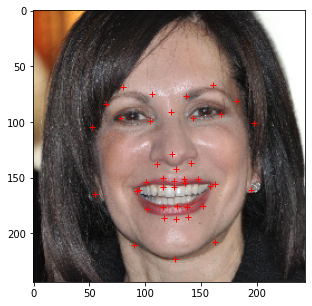

In [ ]:
# Generate random image from the test data
plt.rcParams['figure.figsize'] = [5, 5]
idx = np.random.randint(test_images.shape[0])
test_img = test_images[idx]
test_pts = test_pred[idx]
visualise_pts(test_img, test_pts)

### Lips

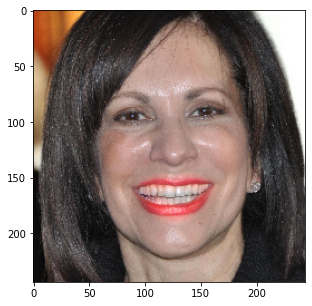

In [ ]:
def get_lip_coords(_img, _pts):
    upper_lip = np.vstack((_pts[22:29], _pts[34:39]))
    lower_lip = np.vstack((_pts[28:35], _pts[38:41]))
    lip_pts = np.vstack((upper_lip, lower_lip))

    return lip_pts

def create_lip_mask(_img,_pts):
    mask = np.zeros_like(_img)
    mask = cv2.fillPoly(mask,np.int32([_pts]),(255,255,255))
    return mask

def change_lip_colour(_img, _pts, colour=(255,0,0)):
    # Create lip mask
    lip_coords = get_lip_coords(_img, _pts)
    lip_mask = create_lip_mask(_img, lip_coords)
    # Create a fully coloured image of the selected colour
    img_coloured_lips = np.zeros_like(lip_mask)
    img_coloured_lips[:] = colour
    # Change colour only where both images return True
    img_coloured_lips = cv2.bitwise_and(lip_mask,img_coloured_lips)
    # Apply blur to make image more realistic
    img_coloured_lips = cv2.GaussianBlur(img_coloured_lips,(11,11),10,10)
    # Blend images, original image is assigned a weight of 1, coloured lips get a smaller weight, gamma is 0
    result = np.copy(_img)
    result = cv2.addWeighted(result,1,img_coloured_lips,0.3,0)  # Merging with original image.
    return result

img_coloured_lips = change_lip_colour(test_img, test_pts)
plt.imshow(img_coloured_lips)
plt.show()

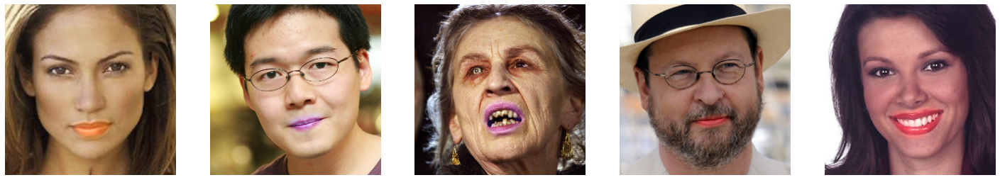

In [ ]:
# Show successful cases
plt.rcParams['figure.figsize'] = [25, 5]
successful_cases = [445, 334, 48, 274, 364]
colours = [(255,150,0),
           (0,0,255),
           (92,55,255),
           (255,0,0),
           (255,0,0)]
for i,idx in enumerate(successful_cases):
    plt.subplot(1,5,i+1)
    plt.axis('off')
    img_test = test_images[idx]
    pts_test = test_pred[idx]
    img_coloured_lips = change_lip_colour(img_test, pts_test, colours[i])
    plt.imshow(img_coloured_lips)

plt.savefig("lip_colour_successful.png")
plt.show()

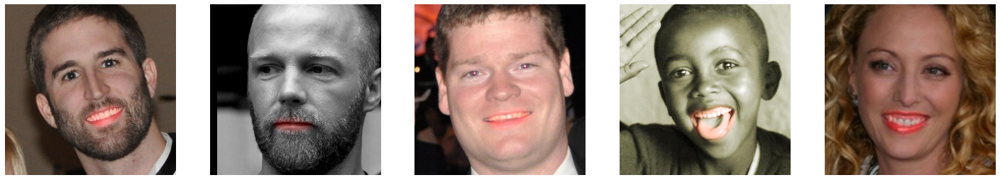

In [ ]:
# Show failure cases
faulty_cases = [91, 60, 157, 316, 312]
for i,idx in enumerate(faulty_cases):
    plt.subplot(1,5,i+1)
    plt.axis('off')
    img_test = test_images[idx]
    pts_test = test_pred[idx]
    img_coloured_lips = change_lip_colour(img_test, pts_test, (255,0,0))
    plt.imshow(img_coloured_lips)
    
plt.savefig("lip_colour_faulty.png")

### Eyes

In [ ]:
from sklearn.cluster import KMeans
import operator

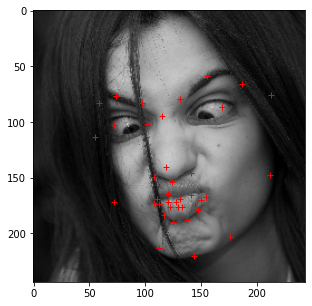

In [ ]:
# Generate random image from the test data
plt.rcParams['figure.figsize'] = [5, 5]
idx = np.random.randint(test_images.shape[0])
test_img = test_images[idx]
test_pts = test_pred[idx]
visualise_pts(test_img, test_pts)
plt.imshow(test_img)

In [ ]:
def find_midpoint(p1 ,p2):
    '''
    Find the midpoint between eye landmarks
    '''
    return int((p1[0] + p2[0])/2), int((p1[1] + p2[1])/2)

def max_dist_to_mp(_pts):
    '''
    Find the point with the maximum distance to midpoint
    '''
    mp = find_midpoint(_pts[0], _pts[1])
    dists = [abs(p[0]-mp[0]) for p in _pts]
    return max(dists)

def crop_eye_rect(_img, _pts):
    '''
    Create a rectangle around the eye
    :param _img: img to be cropped
    :param _pts: landmarks for an eye
    '''
    max_dist = max_dist_to_mp(_pts) # Use max distance to approximate lengths of rect sides
    mp = find_midpoint(_pts[0], _pts[1]) # Find the midpoint
    # Create a rectangle around the eye
    start_pt = (np.uint32(mp[0]-max_dist), np.uint32(mp[1]+max_dist))
    end_pt = (np.uint32(start_pt[0]+max_dist*2.5), np.uint32(start_pt[1]-max_dist*2))
    rect_pts = np.asarray([start_pt, (start_pt[0], start_pt[1]-max_dist*2), end_pt, (start_pt[0]+max_dist*2.5, start_pt[1])])

    # Set everything outside of the selected region to 0
    mask = np.zeros_like(_img)
    mask = cv2.fillPoly(mask,np.int32([rect_pts]),(255,255,255))
    img_copy = np.copy(_img)
    img_copy = cv2.bitwise_not(img_copy)
    img_copy[mask==0] = 0
    return img_copy, np.uint32(rect_pts)

def seg_img(_img, n_clusters):
    '''
    Apply segmentation
    '''
    kmeans = KMeans(n_clusters, random_state=0) # Initialize kmeans object
    kmeans.fit(_img.reshape(-1,3)) # Fit kmeans, image should be (n_pixels, 3) shape
    seg_labels = kmeans.labels_ # Get labels
    return seg_labels

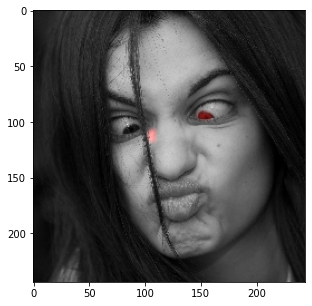

In [ ]:
def create_eye_mask(_img, _pts):
    '''
    Create a mask for an iris
    '''
    # Find approximate region around the eye
    eye, rect_pts = crop_eye_rect(_img, _pts)
    # Segment pixels in the region
    seg = seg_img(eye, 5).reshape(eye.shape[:2])
    # Use the cluster with the smallest number of pixels
    cluster_sizes = [(i, len(seg[seg==i])) for i in np.unique(seg)]
    n_cluster = min(cluster_sizes, key=operator.itemgetter(1))[0]
    # Create binary mask
    mask = np.zeros_like(_img)
    mask[seg==n_cluster] = 255
    mask = np.mean(mask, axis=-1)
    # Use opening operation
    kernel = np.ones((3,3),np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    # If several blobs are found - choose the largest one 
    _, thresh = cv2.threshold(mask,0,255,cv2.THRESH_BINARY)
    cnts, _ = cv2.findContours(np.uint8(thresh), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    cnt = max(cnts, key=cv2.contourArea, default=0)
    new_img = np.zeros_like(mask)
    if len(cnts)>0:
        cv2.drawContours(new_img, [cnt], -1, 255, cv2.FILLED)
        mask = cv2.bitwise_and(mask,new_img)
    
    return mask

def change_eye_colour(_img, _pts, colour=(255,0,0)):
    '''
    Change the colour of an iris
    '''
    left_eye_pts = _pts[18:20]
    right_eye_pts = _pts[20:22]
    # Create a mask for each eye
    left_eye_mask = np.uint8(create_eye_mask(_img, left_eye_pts))
    right_eye_mask = np.uint8(create_eye_mask(_img, right_eye_pts))
    # Combine masks
    eye_mask = cv2.bitwise_or(left_eye_mask, right_eye_mask)
    eye_mask = np.expand_dims(eye_mask, axis=2)
    eye_mask = np.concatenate((eye_mask, eye_mask, eye_mask), axis=2)

    # Create a new image full of select colour
    img_coloured_eyes = np.zeros_like(eye_mask)
    img_coloured_eyes[:] = colour
    # Combine to get coloured eyes image 
    img_coloured_eyes = cv2.bitwise_and(eye_mask,img_coloured_eyes)
    # Apply blur to make image more realistic
    img_coloured_eyes = cv2.GaussianBlur(img_coloured_eyes,(5,5),10,10)
    # Blend images, original image is assigned a weight of 1, coloured lips get a smaller weight, gamma is 0
    result = np.copy(_img)
    result = cv2.addWeighted(result,1,img_coloured_eyes,0.4,0)  # Merging with original image.
    return result

img_coloured_eyes = change_eye_colour(test_img, test_pts)
plt.imshow(img_coloured_eyes)
plt.show()

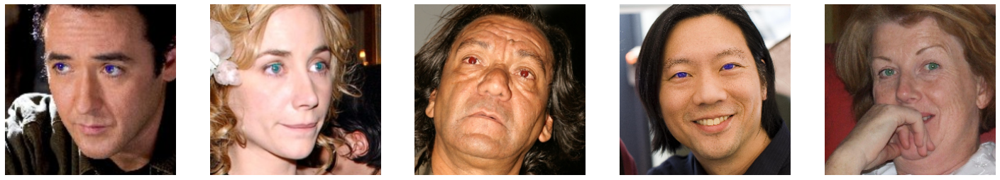

In [ ]:
# Show successful cases
plt.rcParams['figure.figsize'] = [25, 5]
successful_cases = [352, 384, 480, 338, 217]
colours = [(0,0,255),
           (0,255,255),
           (255,0,0),
           (0,0,255),
           (10,82,42)]
for i,idx in enumerate(successful_cases):
    plt.subplot(1,5,i+1)
    plt.axis('off')
    test_img = test_images[idx]
    test_pts = test_pred[idx]
    img_coloured_eyes = change_eye_colour(test_img, test_pts, colours[i])
    plt.imshow(img_coloured_eyes)

plt.savefig("eye_colour_successful.png")
plt.show()

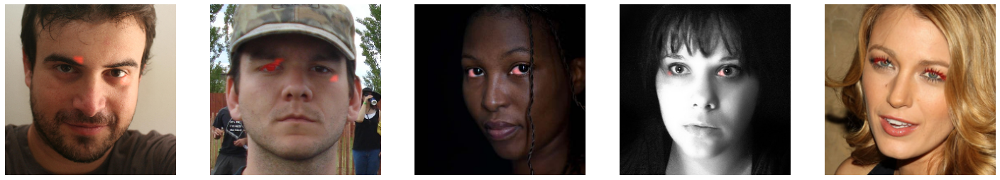

In [ ]:
# Show failure cases
plt.rcParams['figure.figsize'] = [25, 5]
faulty_cases = [236, 0, 436, 56, 130]
for i,idx in enumerate(faulty_cases):
    plt.subplot(1,5,i+1)
    plt.axis('off')
    test_img = test_images[idx]
    test_pts = test_pred[idx]
    img_coloured_eyes = change_eye_colour(test_img, test_pts)
    plt.imshow(img_coloured_eyes)
    
plt.savefig("eye_colour_faulty.png")